Notebook tutorial to do exploratory analysis with MCD files. The following shows an example of a small-cell lung cancer aquisition.

Search for "TODO" in this notebook to change accordingly to your specific scenrios.

In [1]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import pickle as pkl
import skimage
import yaml
from typing import Union, Optional, Type, Tuple, List, Dict
import sys
from readimc import MCDFile

#TODO: change to path of the local repository
ROOT_DIR = '/project/Xie_Lab/zgu/xiao_multiplex/multiTAP'
sys.path.append(ROOT_DIR)
sys.path.append(os.path.join(ROOT_DIR, 'image_cytof'))

from cytof.hyperion_preprocess import cytof_read_data_roi
# from cytof.hyperion_analysis import 
from cytof import utils 
from utils import process_mcd, save_multi_channel_img, check_feature_distribution, show_color_table

from cytof import classes 
from classes import CytofImage, CytofCohort, CytofImageTiff

/project/Xie_Lab/zgu/conda_stuff/envs/cytof-shared/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#TODO: change filename here
filename = "/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_mdacc/09-11810G-8.mcd"


1
sid: Slide0
{'ID': '1', 'Description': 'ROI_001', 'AblationPower': '1.5', 'AblationDistanceBetweenShotsX': '1', 'AblationDistanceBetweenShotsY': '1', 'AblationFrequency': '200', 'AcquisitionROIID': '1', 'OrderNumber': '0', 'SignalType': 'Dual', 'DualCountStart': '1', 'DataStartOffset': '385227', 'DataEndOffset': '123265227', 'StartTimeStamp': '2022-04-04T09:54:03.442-05:00', 'EndTimeStamp': '2022-04-04T10:59:04.98-05:00', 'AfterAblationImageEndOffset': '1230646463', 'AfterAblationImageStartOffset': '1229938759', 'BeforeAblationImageEndOffset': '1229938759', 'BeforeAblationImageStartOffset': '1229185227', 'ROIStartXPosUm': '28645105', 'ROIStartYPosUm': '18055078', 'ROIEndXPosUm': '29445.627', 'ROIEndYPosUm': '17257.614', 'MovementType': 'XRaster', 'SegmentDataFormat': 'Float', 'ValueBytes': '4', 'MaxY': '800', 'MaxX': '800', 'PlumeStart': '1896', 'PlumeEnd': '2280', 'Template': 'Bo Zhu 2022-0225 SCLC_final', 'ProfilingType': 'Global'}
processing slide_id-roi: Slide0-ROI_001
roi channe

<Figure size 640x480 with 0 Axes>

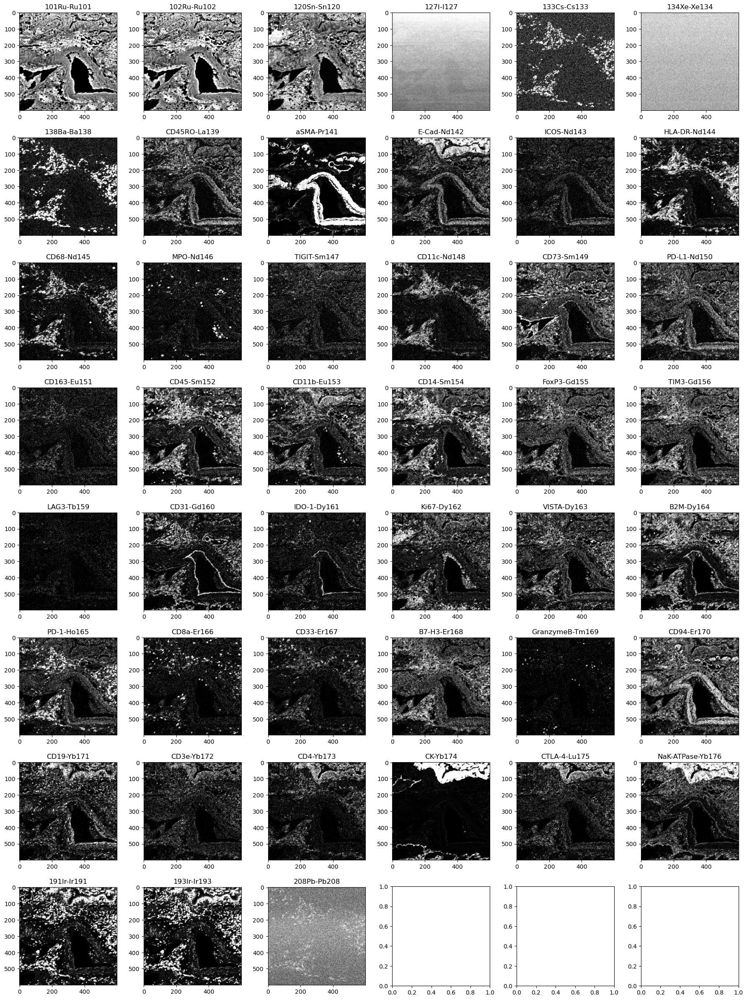

{'ID': '2', 'Description': 'ROI_002', 'AblationPower': '1.5', 'AblationDistanceBetweenShotsX': '1', 'AblationDistanceBetweenShotsY': '1', 'AblationFrequency': '200', 'AcquisitionROIID': '2', 'OrderNumber': '0', 'SignalType': 'Dual', 'DualCountStart': '1', 'DataStartOffset': '123265227', 'DataEndOffset': '246145227', 'StartTimeStamp': '2022-04-04T10:59:18.296-05:00', 'EndTimeStamp': '2022-04-04T12:03:28.225-05:00', 'AfterAblationImageEndOffset': '1232168088', 'AfterAblationImageStartOffset': '1231445775', 'BeforeAblationImageEndOffset': '1231445775', 'BeforeAblationImageStartOffset': '1230646463', 'ROIStartXPosUm': '29864365', 'ROIStartYPosUm': '15969534', 'ROIEndXPosUm': '30664.868', 'ROIEndYPosUm': '15172.065', 'MovementType': 'XRaster', 'SegmentDataFormat': 'Float', 'ValueBytes': '4', 'MaxY': '800', 'MaxX': '800', 'PlumeStart': '1896', 'PlumeEnd': '2280', 'Template': 'Bo Zhu 2022-0225 SCLC_final', 'ProfilingType': 'Global'}
processing slide_id-roi: Slide0-ROI_002
roi channel labels [

<Figure size 640x480 with 0 Axes>

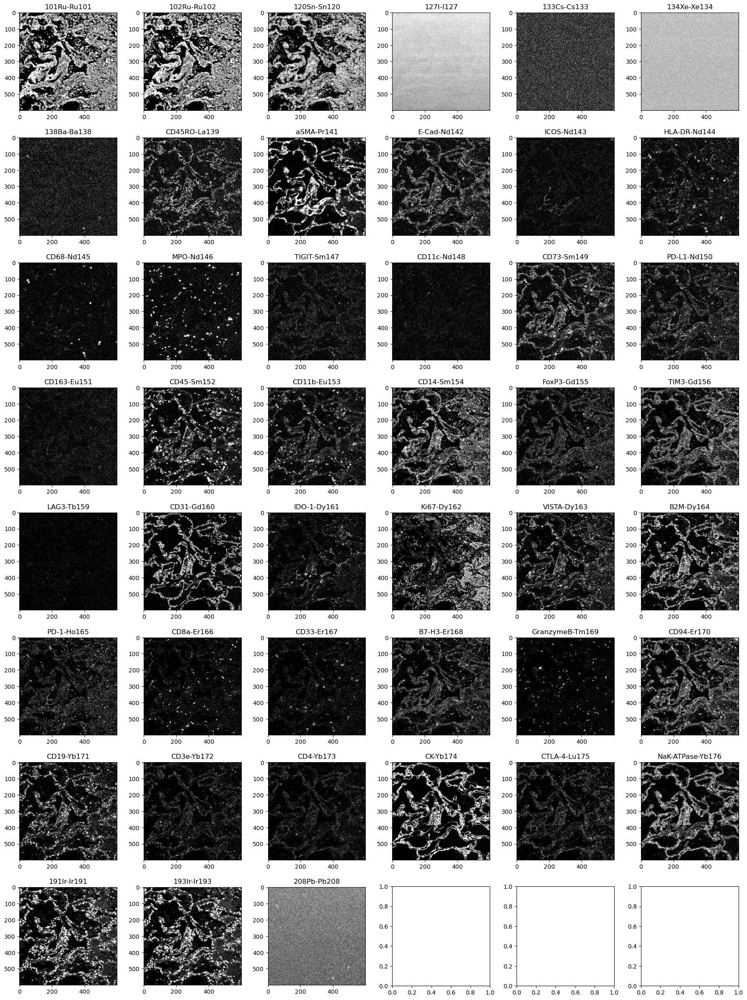

In [3]:
%matplotlib inline

# visualize n={threshold} cores in the MCD
# this is used to visually confirm tissues are successfully scanned,
# and remove any channels that consistently did not have signals 
# the defnition of consistent and threshold is domain specific
counter = 0
threshold = 2 # for memory consideration

with MCDFile(filename) as f:
    print(len(f.slides))
    for slide in f.slides: # len(f.slides)=1
        sid = f"{slide.description}{slide.id}"
        print('sid:', sid)
        for roi in slide.acquisitions:
            print(roi.metadata)
            rid = roi.description
            print(f'processing slide_id-roi: {sid}-{rid}')

            print('roi channel labels', roi.channel_labels)
            print('roi channel names', roi.channel_names)

            img_roi = f.read_acquisition(roi)

            # rotated for visualization. adjust if image dimensions mismatch
            img_roi = np.transpose(img_roi, (1, 2, 0))
            cytof_img = CytofImageTiff(slide=sid, roi = rid, image=img_roi, filename=f"{sid}-{rid}")
            channels = [f"{mk}-{cn}" for (mk, cn) in zip(roi.channel_labels, roi.channel_names)]
            cytof_img.set_markers(markers=roi.channel_labels, labels=roi.channel_names, channels=channels) # targets, metals
            print('# of channels', len(channels))

            plt.figure()

            # visualiza channels
            cytof_img.check_channels(channels=None, xlim=[0,600], ylim=[0,600], ncols=6, vis_q=0.9, colorbar=False)
            plt.show()
            
            counter +=1
            if counter >= threshold: break
        

In [4]:
print(cytof_img.channels)
print(cytof_img.labels)
print(cytof_img.markers)

['101Ru-Ru101', '102Ru-Ru102', '120Sn-Sn120', '127I-I127', '133Cs-Cs133', '134Xe-Xe134', '138Ba-Ba138', 'CD45RO-La139', 'aSMA-Pr141', 'E-Cad-Nd142', 'ICOS-Nd143', 'HLA-DR-Nd144', 'CD68-Nd145', 'MPO-Nd146', 'TIGIT-Sm147', 'CD11c-Nd148', 'CD73-Sm149', 'PD-L1-Nd150', 'CD163-Eu151', 'CD45-Sm152', 'CD11b-Eu153', 'CD14-Sm154', 'FoxP3-Gd155', 'TIM3-Gd156', 'LAG3-Tb159', 'CD31-Gd160', 'IDO-1-Dy161', 'Ki67-Dy162', 'VISTA-Dy163', 'B2M-Dy164', 'PD-1-Ho165', 'CD8a-Er166', 'CD33-Er167', 'B7-H3-Er168', 'GranzymeB-Tm169', 'CD94-Er170', 'CD19-Yb171', 'CD3e-Yb172', 'CD4-Yb173', 'CK-Yb174', 'CTLA-4-Lu175', 'NaK-ATPase-Yb176', '191Ir-Ir191', '193Ir-Ir193', '208Pb-Pb208']
['Ru101', 'Ru102', 'Sn120', 'I127', 'Cs133', 'Xe134', 'Ba138', 'La139', 'Pr141', 'Nd142', 'Nd143', 'Nd144', 'Nd145', 'Nd146', 'Sm147', 'Nd148', 'Sm149', 'Nd150', 'Eu151', 'Sm152', 'Eu153', 'Sm154', 'Gd155', 'Gd156', 'Tb159', 'Gd160', 'Dy161', 'Dy162', 'Dy163', 'Dy164', 'Ho165', 'Er166', 'Er167', 'Er168', 'Tm169', 'Er170', 'Yb171', 'Yb172

In [5]:
# write out markers and channels for pipeline
lines_to_write = [
    f"labels: {cytof_img.labels}\n",
    f"markers: {cytof_img.markers}"
]

#TODO change save path here
marker_labels_path = os.path.join("/project/Xie_Lab/zgu/xiao_multiplex/sclc_multiTAP_work", "sclc_marker_labels.txt")
with open(marker_labels_path, "w") as f:
    for line in lines_to_write:
        f.write(line)

In [6]:
# use the visualization above to decide if any channels should be removed
# nuclei channels must also be defined
# common nuclei markers: 191Ir, 193Ir, DAPI
# to be used for downstream pipeline

params = {
    # special channels
    "channels_dict": {'nuclei': ['191Ir-Ir191', '193Ir-Ir193'],
                      'membrane': ['HLA-DR-Nd144', 'CD3e-Yb172', 'CD73-Sm149', 'CD45RO-La139', 'CD45-Sm152', 'CD8a-Er166', 'CD4-Yb173', 'CD31-Gd160']
                      },

    # unwanted channels
    "channels_remove": ['127I-I127', '134Xe-Xe134', '208Pb-Pb208']
}

In [9]:
# if needed for batch processing in command line, create a df_cohort_to_load.csv
import pandas as pd
one_slide = '09-11810'
IMC_TIFF_FOLDER = '/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_mdacc/tiffs'
cohort_file_list = []
roi_name = []

# find all samples with the above slide number
for file in glob.glob(os.path.join(IMC_TIFF_FOLDER, f"{one_slide}*")):
  cohort_file_list.append(file)
  roi_name.append(file.split('09-11810')[-1].split('.tiff')[0])
slides = [one_slide] * len(cohort_file_list)
save_group = ['0'] * len(cohort_file_list)

fs_input = cohort_file_list.copy()

# during batch processing, CytofCohort always expect three inputs. 
# First input is for naming purposes (name of the slide of cohort)
# Second input is the varying ROI/TMA that you want to analyze together as one cohort
# Third input is the corresponding file path
# df is required to have three keys for downstream analysis: 'Slide', 'ROI', 'input file'
df_cohort_to_load = pd.DataFrame({"Slide": slides, "ROI": roi_name, "input file": fs_input, 'save_group': save_group}) 
df_cohort_to_load.to_csv('/project/Xie_Lab/zgu/xiao_multiplex/sclc_multiTAP_work/df_cohort_to_load.csv', index=False)

In [10]:
df_cohort_to_load.head()

,Slide,ROI,input file,save_group
0,09-11810,A-4_ROI_001,/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_...,0
1,09-11810,A-4_ROI_002,/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_...,0
2,09-11810,A-4_ROI_003,/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_...,0
3,09-11810,A-4_ROI_004,/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_...,0
4,09-11810,A-4_ROI_005,/project/Xie_Lab/zgu/xiao_multiplex/sclc_data_...,0


In [7]:
!pip list

Package                   Version
------------------------- -----------
aiofiles                  23.2.1
altair                    5.4.1
annotated-types           0.7.0
anyio                     4.5.2
astor                     0.8.1
asttokens                 3.0.0
attrs                     25.3.0
autograd                  1.5
autograd-gamma            0.5.0
backcall                  0.2.0
certifi                   2025.1.31
charset-normalizer        3.4.1
click                     8.1.8
comm                      0.2.2
contourpy                 1.1.1
cycler                    0.12.1
debugpy                   1.6.7
decorator                 5.1.1
entrypoints               0.4
exceptiongroup            1.2.2
executing                 2.1.0
fastapi                   0.115.12
ffmpy                     0.5.0
filelock                  3.16.1
fonttools                 4.57.0
formulaic                 0.6.2
fsspec                    2025.3.0
future                    0.18.3
gradio              